In [2]:
%matplotlib inline

# standard
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcs

# plot style 
from jupyterthemes import jtplot
jtplot.style()

# useful imports
from sklearn.metrics import pairwise_distances, pairwise_distances_argmin
from sklearn.cluster import KMeans

# fix a long enough list of colors (one for each cluster)
cmap = [ mcs.to_rgb(c) for c in plt.get_cmap('tab20').colors ]
cmap.extend([ mcs.to_rgb(c) for c in plt.get_cmap('tab20b').colors ] )
cmap.extend([ mcs.to_rgb(c) for c in plt.get_cmap('tab20c').colors ] )

# useful lambda terms
to_hours = lambda x : float( \
    ((type(x) is pd.Timedelta) and (x.days*24.0 + ((x.seconds/60)/60))) or \
     ((type(x) is pd.Timestamp) and ((x.dayofyear-1)*24 + x.hour + x.minute/60)))

conve = lambda ii : \
    lambda x : (ii, x)

# define some useful time ranges
tics = pd.Series(np.linspace(0, 23.5, 48))
days = pd.date_range('2013-01-01', '2013-12-31', freq='1D').map(to_hours)



# Behavior of Sample Paths

### Load Observed Time-Series
Load and re-index thresholded pool of time-series observations 

In [3]:
# load sample paths
data = pd.read_pickle('./pickle/2013-10x90-samp.pkl')

# extract observation times (in hours) 
#       ... relatvie to first obs.
times = (data.index - data.index[0]).map(to_hours)

# change index to 'times'
data.set_index( times, inplace=True )


### Extracting New Features 
 We will be transforming the sample-paths into vectors which have the nice property that the squared euclidean norm $\lVert x \rVert^2$ has the form 
$$ \lVert y\rVert^2 + \sum_{k=1}^H\lVert \mathcal{L_k} y \rVert^2 $$
where each $\mathcal{L_k}$ is a linear operator acting on $y$ and $y$ is equal to $x\vert_I$ for some subset $I$ of indicies. 

#### Finite-Differences

In our case, we want $\mathcal{L}_k = (\Delta)^k$, where $\Delta$ is the standard forward-difference operator mapping $v\in\mathbb{R}^K$ to
   $$\Delta v = \langle (t_{i+1}-t_{i})^{-1}(v_{i+1}-v_{i}) : i < K\rangle \in \mathbb{R}^{K-1}$$
 and for some fixed $n\in\mathbb{N}$, $y = x\vert_{[0,n)}$ is a member of our sample space.

To construct these vectors, we proceed as follows

In [ ]:
H = 3 # highest order FD to calculate

# initialize segment dict and calculate time-steps 
segment = dict.fromkeys( range(H), None ) 

# begin recursion
segment[0] = data
for ii in range(H-1):
    # calculate time-steps
    dt = np.diff(segment[ii].index)
    
    # calculate forward-difference
    segment[ii+1] = \
        (segment[ii].diff(-1).\
            drop(index=segment[ii].index[-1])).\
                apply( lambda x : x/dt )
    

#### Combine  Segments

Merging the segments togther, we use an appropriate `pd.MultiIndex` to seperate out the images under the FD operator.

In [5]:
# add segment number to indices
for ii in range(H):
    segment[ii].rename(index=conve(ii), inplace=True)

# combine segments
sobolev = pd.concat( segment.values(), axis=0 ).\
    transpose()

# build MultiIndex
sobolev.set_axis( 
    pd.MultiIndex.from_tuples(
        sobolev.columns, 
        sortorder=2, 
        names=['order', 't']),
    axis=1,
    inplace=True)


### K-means Clustering

We're going to apply K-means to the sobolev vectors we just constructed; so we single out a set of days to consider, then extract the readings corresponding those days; using those projected vectors as the training set.

In [47]:
ndays = 3 # days
freq =  3 # hours 

# select days for training set
center = np.random.choice(days)
samp = center + \
    np.arange(-24*(ndays-1)/2, 24*(ndays-1)/2 + 0.5, freq)

# convert generate list of relevant times 
train_regions = [d + tics for d in samp ]
train_times = pd.concat(train_regions)

# extract training data
train = sobolev.loc[:, (range(H),train_times) ].dropna()

#### Compute Cluster Centers

In [140]:

K = 15 # number of clusters
N = len(train_regions) # number of models to fit

# parameters 
params = dict(
    n_clusters=K,
    tol=1e-10,
    init='k-means++', n_init=10, max_iter=300,
    algorithm='auto',
    random_state=None, verbose=1, n_jobs=3,
    precompute_distances='auto', copy_x=True)

# initialize 'N' k-means instances
kobjs = map(lambda x : KMeans(**params), range(N))

# calculate cluster centers
centers = []
for n, k in enumerate(kobjs):
    # apply K-means on n'th training partition.
    k.fit(train.loc[:,( range(H), 
                        train_regions[n])]) 
    
    # store cluster centers
    centers.append(
        k.cluster_centers_)
    
    # indicate we've finished one run
    display(k)


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=15, n_init=10, n_jobs=3, precompute_distances='auto',
       random_state=None, tol=1e-10, verbose=1)

#### Order Centers According to Cluster Size

In [141]:
# def 'region' 
region = train.copy()
labels = pd.DataFrame(columns=np.arange(0,N))
# score region
for ii, c in enumerate(centers):
    # assign each path a label according to it's nearest k-means center.
    vecs = train.loc[:, (range(H), train_regions[ii])]
    tmp = pd.Series(
        pairwise_distances_argmin(vecs, c),
        index=vecs.index)
    
    # order by centers by cluster size
    szorder = list(tmp.value_counts().\
                       sort_values(ascending=True).\
                       index)  # store size ordering
    
    # apply order to centers
    centers[ii] = c[szorder]
    
    # update and store path labels 
    labels[ii]=tmp.apply(szorder.index)
    pass

## Analysis of Clusters
First, lets setup some tools to enable our analysis

In [142]:
# some housekeeping
ids = list(range(K))

# some summary info for each cluster
cluster = pd.DataFrame(
    index=pd.MultiIndex.from_product(
        [range(N), ids], names=['N', 'K']))

root = cluster.copy()

cluster.sort_index(inplace=True)
cluster['sz'] = ""
cluster['members'] = ""

# store cluster sizes and set of members
for ii in range(N):
    cluster.loc[:,'sz'] = cluster.index.\
        map(lambda x : \
            labels[x[0]].value_counts()[x[1]])
    
    cluster.loc[:,'members'] = cluster.index.\
            map(lambda x : \
                  set(labels[x[0]].\
                          where(labels[x[0]] == x[1]).dropna().index))

### Conditional Expectation of $X_t$ and $\Delta X_t$ 
To begin let's look at the conditional expectations and variances,

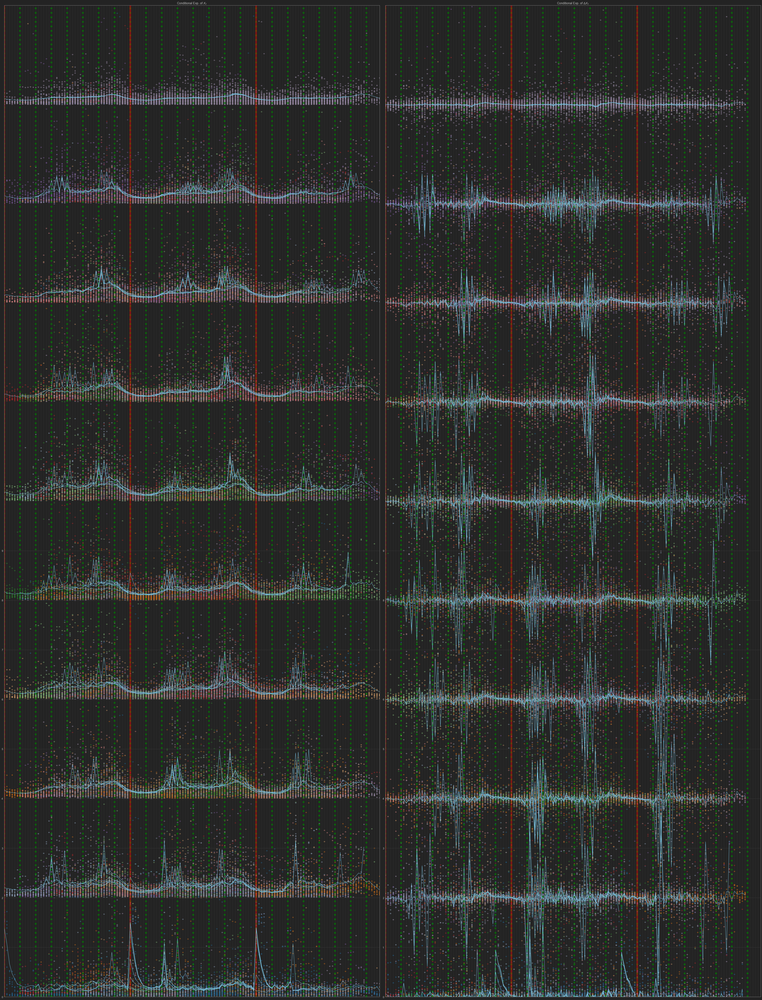

In [58]:

fig, means = plt.subplots(1, 2)
fig.set_size_inches(12.5 * H, 65.5)

means[0].set_title('Conditional Exp. of $X_t$')
means[1].set_title('Conditional Exp. of $\Delta X_t$')

rho = 2
for j0, t in enumerate(means):
    t0 = train_times-min(train_times)
    s0 = set([x.min()-min(samp) for x in train_regions ])
    s0 = s0.union([x+days[1] for x in s0])
    d0 = days[days.map(lambda d: d in samp)] - min(train_times)
    
    ymax = rho*(max(ids)+1); ymin = rho*min(ids)
    xmax = max(t0);          xmin = min(t0)
    
    t.set_xlim(xmin, xmax); t.set_xticks(t0);  t.set_xticklabels([]);
    t.set_ylim(ymin, ymax); t.set_yticks(ids);
    
    t.hlines( list(ids), xmin, xmax, linestyle=':', color='gray',  alpha=0.3)
    t.vlines( list(s0),  ymin, ymax, linestyle=':', color='green', linewidth=4, alpha=0.7)
    t.vlines( list(d0),  ymin, ymax,                color='red',   linewidth=4, alpha=0.4)
    
    for k0 in ids:
        offset = rho*k0        
        for i0 in range(N):
            members = cluster.loc[(i0,k0),].members
            values = region.loc[members,
                                ( j0, 
                                  train_regions[i0] )]
            # expected value conditioned on cluster label
            mu = values[j0].mean()
            t0 = mu.index.values - samp[j0]
            
            t.plot( t0, mu.values + offset, color='c' )
            for idx, path in values[j0].sample(1+min(10, len(members)-1)).iterrows():
                if i0 > 0:
                    c = cmap[ labels.loc[idx,i0-1] ]
                else:
                    c = cmap[k0]
                
                t.scatter( t0, path.values + offset, color=[c], alpha=0.6)
            

fig.tight_layout()
fig.savefig('expect.png')

### Conditional Distribution of Readings

 Fix bins for each segment of `sobolev`

In [60]:
bins = [np.linspace(0, 1, 101), 
        np.linspace(-2, 2, 101)]

Compute and store histograms

In [62]:
# returns the histogram 
frag = lambda x : \
   [ (np.histogram(region.loc[x.members,order].stack().dropna().values,
        bins=bins[order]))[0] 
            for order in range(H) ]

# insert histogram column into 'cluster'
cluster['hist'] = cluster.apply( frag, axis=1 )

Plot 

In [ ]:
# setup plot
fig, dists = plt.subplots( len(ids), 2 )
fig.set_size_inches(10, len(ids)*4)

# plot the histograms
for kk in ids:
    #plt.scatter( freq.index[vals], freq[vals], c=[cmap[kk]], s=0.9 z
    for order in range(H):
        op = '\Delta ' * (order > 0) + f'^{order}'*(order>1)
        dists[kk,order].set_title(f'$p({op}X_t$ | $\ell={kk})$'
                                  f' ($N={cluster.loc[kk].N}$)')
        dists[kk,order].\
            hist((bins[order][1:]+bins[order][:-1])/2, bins=bins[order], 
                 weights=cluster.loc[kk,'hist'][order],
                 density=True, color=cmap[kk])
        pass

fig.tight_layout()
fig.savefig('dists.png')